# Машинное обучение, ФКН ВШЭ
## Практическое задание 4.

__Дата выдачи: 06.12.2016__

__Дедлайн: 18.12.2016 05:59 MSK__


Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце Вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

В финальной версии ноутбука, которая отправляется для сдачи задания, должны быть быть выполнены следующие условия:
* все ячейки выполнены для представленной в ноутбуке версии кода
* результаты выполнения ячеек отображены и согласованы с кодом
* при повторном запуске ячеек результаты должны воспроизводиться с точностью до случайности

Для сдачи задания переименуйте получившийся файл \*.ipynb в соответствии со следующим форматом: HW4_Username.ipynb, где Username — Ваша фамилия и инициалы на латинице (например, HW4_IvanovII.ipynb). Далее отправьте этот файл на hse.cs.ml+<номер группы>@gmail.com (например, hse.cs.ml+141@gmail.com для студентов группы БПМИ-141).

## Кластеризация

![Digits](https://www.dropbox.com/s/nrjiahdbpswd63y/digits.png?dl=1)

Задача [кластеризации](https://en.wikipedia.org/wiki/Cluster_analysis) данных является одним из примеров задач обучения "без учителя". Она заключается в разбиении множества объектов на заданное число кластеров, при этом предполагается, что внутри одного кластера будут находиться похожие между собой объекты. Одним из примеров методов кластеризации является алгоритм [KMeans](https://en.wikipedia.org/wiki/K-means_clustering).

### Выбор числа кластеров

Для некоторых алгоритмов кластеризации число кластеров является гиперпараметром (например, в случае KMeans). Поэтому для выбора количества кластеров может быть использован следующий подход: при фиксированной метрике качества для разного числа кластеров обучают алгоритм и выбирают то значение гиперпараметра, начиная с которого качество "стабилизируется".

### Метрики качества

Оценивание качества построенной кластеризации — не всегда тривиальная задача, поскольку следует учитывать ряд фактов:
 - объекты одного класса должны быть более похожими, чем объекты других кластеров, относительно некоторой заданной метрики похожести
 - метрика не должна учитывать истинные значения меток объектов, попавших в кластер (в случае, если истинные метки известны)

При выполнении задания для оценки качества получившейся кластеризации воспользуемся следующими метриками:
 - [Homogeneity и Completeness](http://scikit-learn.org/stable/modules/clustering.html#homogeneity-completeness-and-v-measure) 
 - [Adjusted Rand index](http://scikit-learn.org/stable/modules/clustering.html#adjusted-rand-index) 
 - [Silhouette Coefficient](http://scikit-learn.org/stable/modules/clustering.html#silhouette-coefficient)

Загрузите набор данных [digits](http://scikit-learn.org/stable/modules/generated/sklearn.datasetsload_digits.html). Перед применением алгоритмов не забудьте перемешать изображения в случайном порядке.

In [147]:
from sklearn.datasets import load_digits
digits = load_digits() 

from sklearn.utils import shuffle

**1. (1 балл)** Кластеризуйте изображения при помощи алгоритма [KMeans](http://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html), подобрав число кластеров для любой фиксированной метрики из указанных выше. Рассмотрите различные способы выбора начального приближения (параметр *init*). Оцените качество получившейся кластеризации, используя все описанные выше метрики. Визуализируйте изображения, соответствующие центроидам лучшей кластеризации.

In [148]:
from matplotlib import pyplot as plt
%matplotlib inline

In [149]:
data = digits.images
y = digits.target

data, y = shuffle(data, y, random_state=42)

4


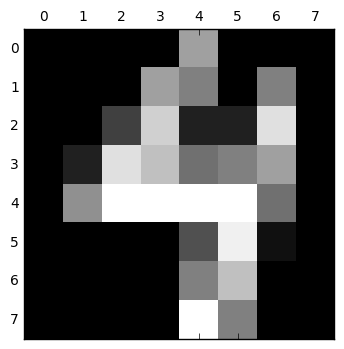

In [133]:
print(y[123])
plt.gray()
plt.matshow(data[123].reshape((8, 8)))

In [134]:
data = digits.images
y = digits.target

data, y = shuffle(data, y, random_state=42)
new_data = []
for i in range(data.shape[0]):
    new_data += [data[i].reshape(8*8)]
data = new_data

7
0.18927851666
11
0.727491570943
27
0.906490505955


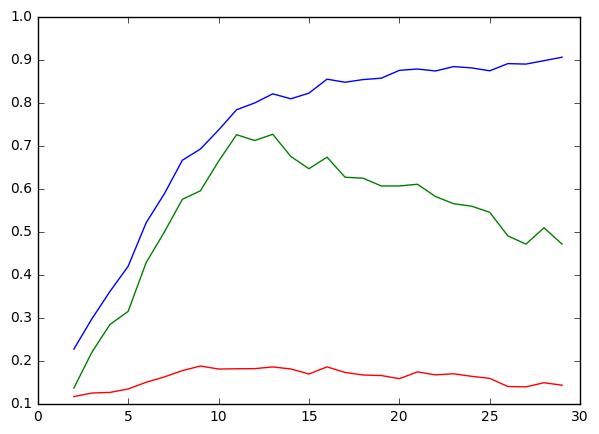

In [135]:
plt.figure(figsize=(7, 5))
from sklearn.cluster import KMeans
from sklearn import metrics
import numpy as np
from sklearn.preprocessing import scale


n = []
met_1 = []
met_2 = []
met_3 = []

for i in range(2, 30):
    kmeans = KMeans(init='random', n_clusters=i).fit(data)
    y_pred = kmeans.predict(data)
    m1 = metrics.silhouette_score(data, kmeans.labels_, metric='euclidean')
    m2 = metrics.adjusted_rand_score(y, y_pred)
    m3 = metrics.homogeneity_score(y, y_pred)
    n += [i]
    met_1 += [m1]
    met_2 += [m2]
    met_3 += [m3]
    

plt.plot(n, met_1, color='red')
plt.plot(n, met_2, color='green')
plt.plot(n, met_3, color='blue')

print(np.argmax(met_1))
print(max(met_1))
print(np.argmax(met_2))
print(max(met_2))
print(np.argmax(met_3))
print(max(met_3))


In [136]:
data = digits.images
y = digits.target

data, y = shuffle(data, y, random_state=42)
new_data = []
for i in range(data.shape[0]):
    new_data += [data[i].reshape(8*8)]
data = new_data

13
0.191118068141
10
0.730383122477
27
0.893265024121


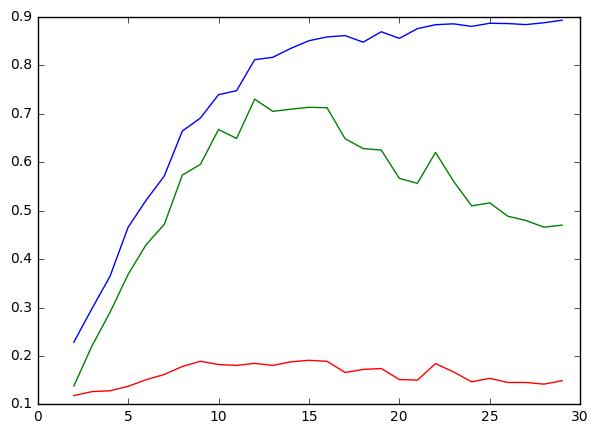

In [137]:
plt.figure(figsize=(7, 5))
from sklearn.cluster import KMeans
from sklearn import metrics
import numpy as np
from sklearn.preprocessing import scale


n = []
met_1 = []
met_2 = []
met_3 = []

for i in range(2, 30):
    kmeans = KMeans(init='random', n_clusters=i).fit(data)
    y_pred = kmeans.predict(data)
    m1 = metrics.silhouette_score(data, kmeans.labels_, metric='euclidean')
    m2 = metrics.adjusted_rand_score(y, y_pred)
    m3 = metrics.homogeneity_score(y, y_pred)
    n += [i]
    met_1 += [m1]
    met_2 += [m2]
    met_3 += [m3]
    

plt.plot(n, met_1, color='red')
plt.plot(n, met_2, color='green')
plt.plot(n, met_3, color='blue')

print(np.argmax(met_1))
print(max(met_1))
print(np.argmax(met_2))
print(max(met_2))
print(np.argmax(met_3))
print(max(met_3))


In [138]:
data = digits.images
y = digits.target

data, y = shuffle(data, y, random_state=42)
new_data = []
for i in range(data.shape[0]):
    new_data += [data[i].reshape(8*8)]
data = new_data

/root/anaconda3/envs/python/lib/python3.5/site-packages/sklearn/cluster/k_means_.py:890: RuntimeWarning: Explicit initial center position passed: performing only one init in k-means instead of n_init=10
  return_n_iter=True)


11
0.183839172297
8
0.741364666076
25
0.900498651874


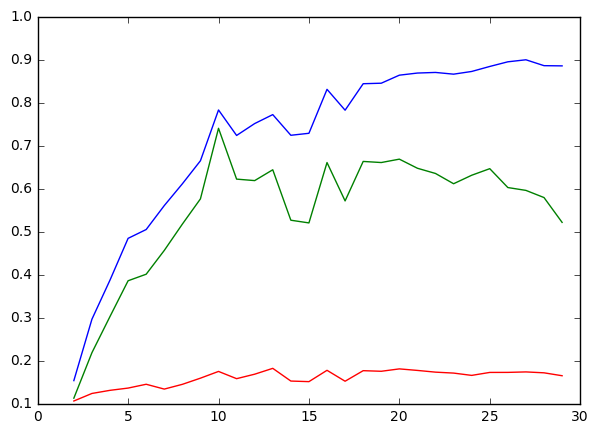

In [140]:
plt.figure(figsize=(7, 5))
from sklearn.cluster import KMeans
from sklearn import metrics
import numpy as np
from sklearn.preprocessing import scale

from sklearn.decomposition import PCA
plt.figure(figsize=(7, 5))

n = []
met_1 = []
met_2 = []
met_3 = []

for i in range(2, 30):
    pca = PCA(n_components=i).fit(data)
    kmeans = KMeans(init=pca.components_, n_clusters=i).fit(data)
    y_pred = kmeans.predict(data)
    m1 = metrics.silhouette_score(data, kmeans.labels_, metric='euclidean')
    m2 = metrics.adjusted_rand_score(y, y_pred)
    m3 = metrics.homogeneity_score(y, y_pred)
    n += [i]
    met_1 += [m1]
    met_2 += [m2]
    met_3 += [m3]
    

plt.plot(n, met_1, color='red')
plt.plot(n, met_2, color='green')
plt.plot(n, met_3, color='blue')

print(np.argmax(met_1))
print(max(met_1))
print(np.argmax(met_2))
print(max(met_2))
print(np.argmax(met_3))
print(max(met_3))


Видно что лучше всего дполучентся при 8 кластерах при init=pca.components_

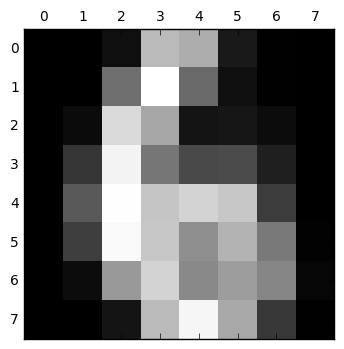

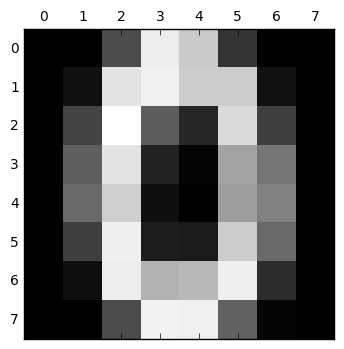

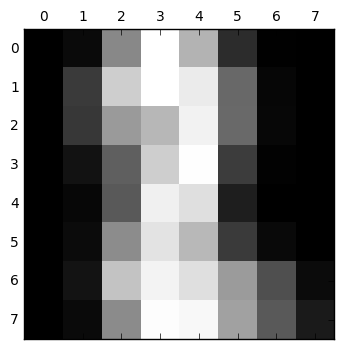

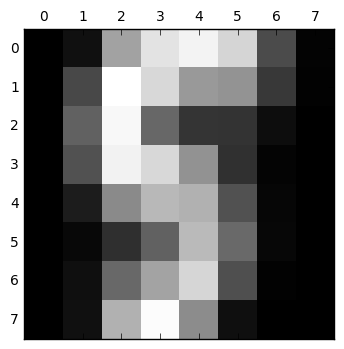

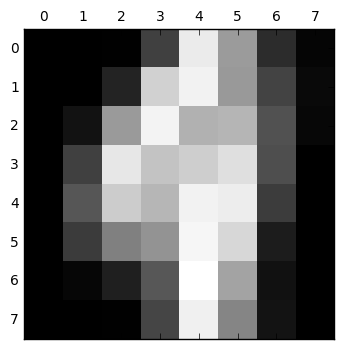

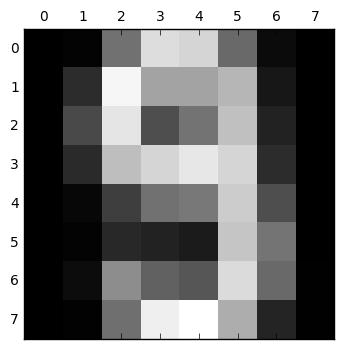

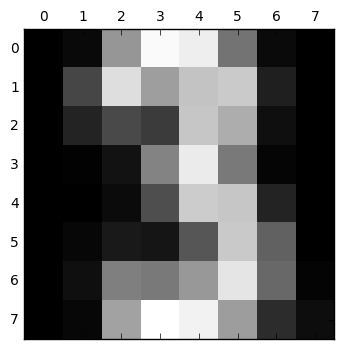

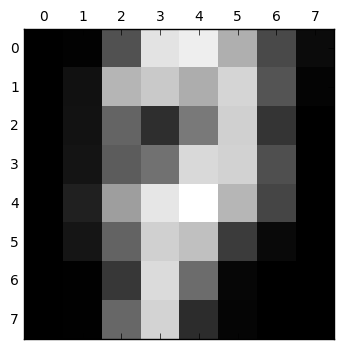

In [141]:
pca = PCA(n_components=8).fit(data)
kmeans = KMeans(init=pca.components_, n_clusters=8, n_init=1).fit(data)

centroids = kmeans.cluster_centers_
centroids.shape
plt.gray() 
for i in centroids:
    plt.matshow(i.reshape((8, 8)))


Не всегда бывает удобно работать с полной матрицей объект-признак — например, для визуализации подходят лишь выборки размерности не больше трёх. На лекциях был рассмотрен метод уменьшения размерности *PCA*. В документации sklearn есть [сравнение](http://scikit-learn.org/stable/auto_examples/manifold/plot_lle_digits.html#example-manifold-plot-lle-digits-py) различных способов понижения размерности для проекции на плоскость. На изображениях видно, что некоторые преобразования дают неплохую визуализацию, где одинаковые цифры расположены близко друг к другу. Посмотрим, поможет ли это на практике.
 
**2. (1 балл)** Примените преобразования [PCA](http://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html) и [t-SNE](http://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html) (для числа компонент 2 и 10), проведите кластеризацию в новых признаковых пространствах и сравните результаты с предыдущими. Нашелся ли метод кластеризации, превосходящий другие по всем метрикам? Являются ли все три метрики согласованными? Можете ли вы объяснить, почему так произошло?

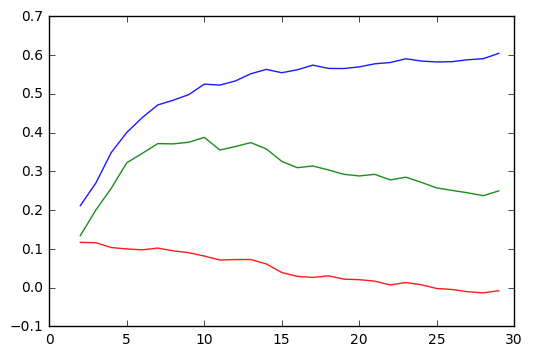

0
0.116990214713
8
0.387984765202
27
0.604807882223



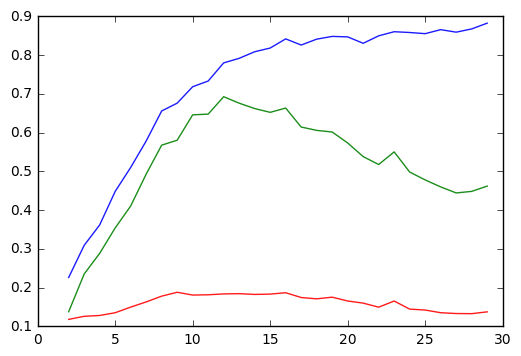

7
0.188188148151
10
0.692836312253
27
0.882684036075



In [151]:
for k_n in (2, 10):
    data = digits.images
    y = digits.target

    data, y = shuffle(data, y, random_state=42)
    new_data = []
    for i in range(data.shape[0]):
        new_data += [data[i].reshape(8*8)]
    data = new_data
    reduced_data = PCA(n_components=k_n).fit_transform(data)
    
    n = []
    met_1 = []
    met_2 = []
    met_3 = []

    for i in range(2, 30):
        kmeans = KMeans(n_clusters=i).fit(reduced_data)
        y_pred = kmeans.predict(reduced_data)
        m1 = metrics.silhouette_score(data, kmeans.labels_, metric='euclidean')
        m2 = metrics.adjusted_rand_score(y, y_pred)
        m3 = metrics.homogeneity_score(y, y_pred)

        n += [i]
        met_1 += [m1]
        met_2 += [m2]
        met_3 += [m3]

    plt.plot(n, met_1, color='red', alpha=float(i)/10.)
    plt.plot(n, met_2, color='green', alpha=float(i)/10.)
    plt.plot(n, met_3, color='blue', alpha=float(i)/10.)
    plt.show()

    print(np.argmax(met_1))
    print(max(met_1))
    print(np.argmax(met_2))
    print(max(met_2))
    print(np.argmax(met_3))
    print(max(met_3))
    print()

Преобразования данных с помощью PCA не дало никаких улучшений 

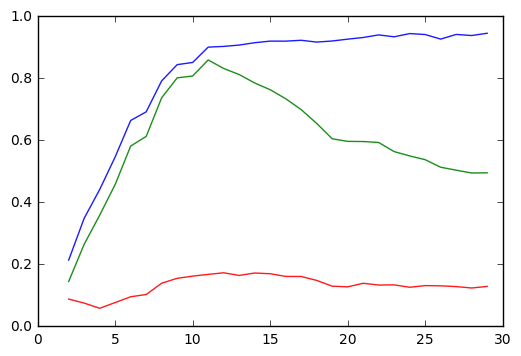

10
0.17305342661
9
0.859672508547
27
0.945794976077



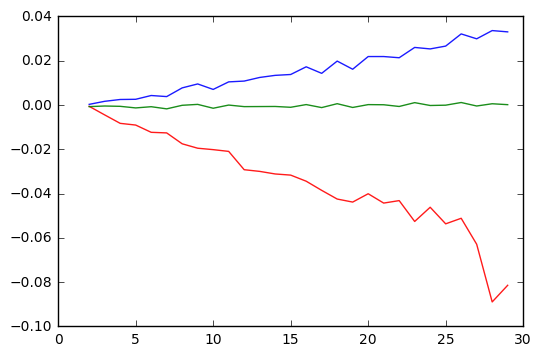

0
-0.000591558015971
24
0.00113017041671
26
0.0336164796831



In [154]:
from sklearn.manifold import TSNE

for k_n in (2, 10):
    data = digits.images
    y = digits.target

    data, y = shuffle(data, y, random_state=42)
    new_data = []
    for i in range(data.shape[0]):
        new_data += [data[i].reshape(8*8)]
    data = new_data
    reduced_data = TSNE(n_components=k_n, method='exact').fit_transform(data)
    
    n = []
    met_1 = []
    met_2 = []
    met_3 = []

    for i in range(2, 30):
        kmeans = KMeans(n_clusters=i).fit(reduced_data)
        y_pred = kmeans.predict(reduced_data)
        m1 = metrics.silhouette_score(data, kmeans.labels_, metric='euclidean')
        m2 = metrics.adjusted_rand_score(y, y_pred)
        m3 = metrics.homogeneity_score(y, y_pred)

        n += [i]
        met_1 += [m1]
        met_2 += [m2]
        met_3 += [m3]

    plt.plot(n, met_1, color='red', alpha=float(i)/10.)
    plt.plot(n, met_2, color='green', alpha=float(i)/10.)
    plt.plot(n, met_3, color='blue', alpha=float(i)/10.)
    plt.show()

    print(np.argmax(met_1))
    print(max(met_1))
    print(np.argmax(met_2))
    print(max(met_2))
    print(np.argmax(met_3))
    print(max(met_3))
    print()

Преобразования данных с помощью TSNE(2) дало улучшение качества предсказания модели  

**3. (1 балл)** Визуализируйте несколько изображений, которые во всех случаях были отнесены к неправильному кластеру (объект назовем ошибочно отнесенным, если он имеет иную метку класса, нежели большая часть объектов в кластере). Можете ли вы пояснить, почему так произошло?

## Разделение изображения на семантические компоненты

![RedPanda](http://imgur.com/6Aa52Lm.png)

Алгоритмы кластеризации могут применяться в самых разных целях. Например, в анализе изображений есть задача разделения изображения на семантические компоненты, которую можно решать в том числе с помощью алгоритмов кластеризации. 

Загрузите [изображения](https://www.dropbox.com/s/ybnvkemeus9wupe/images.zip?dl=0).

In [1]:
from skimage import data, io, filters
from skimage.io import imread
import matplotlib.pyplot as plt
d = imread('ducks.jpg')

plt.figure(figsize=(15, 5))

plt.imshow(d[:,:,])
    
o = imread('owl.jpg')

plt.figure(figsize=(15, 5))

plt.imshow(o[:,:])
    

**4. (1 балл)** Для каждого изображения, используя кластеризацию KMeans, выделите компоненты, охарактеризовав каждый пиксель вектором признаков $\psi_i = [\lambda x_i, \lambda y_i, r_i, g_i, b_i]$, где 
$x_i$ и $y_i$ — координаты пикселя, $r_i, g_i, b_i$ — его цвет, $\lambda$ — параметр, выражающий важность пространственной связности перед цветовой похожестью

(188, 250, 3)
(47000, 5)


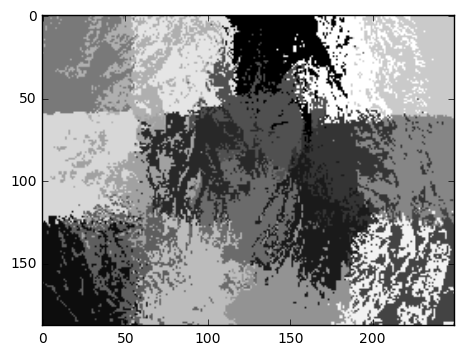

In [103]:
o_matrix = []
l = 2

for i in range(o.shape[0]):
    for j in range(o.shape[1]):
        o_matrix += [[l * i, l * j, o[i][j][0], o[i][j][1], o[i][j][2]]]
        
from sklearn.cluster import KMeans
import numpy as np

kmeans = KMeans(n_clusters=20).fit(o_matrix)

y_pred = kmeans.predict(o_matrix)

o_matrix = np.array(o_matrix)
print(o.shape)
print(o_matrix.shape)
y_pred = y_pred.reshape((o.shape[0], o.shape[1]))

plt.imshow(y_pred)


(211, 250, 3)
(52750, 5)


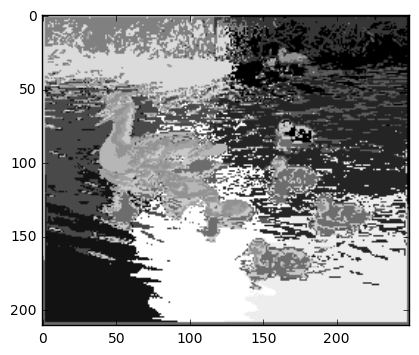

In [81]:
d_matrix = []
l = 0.5

for i in range(d.shape[0]):
    for j in range(d.shape[1]):
        d_matrix += [[l * i, l * j, d[i][j][0], d[i][j][1], d[i][j][2]]]
        
from sklearn.cluster import KMeans
import numpy as np

kmeans = KMeans(n_clusters=15).fit(d_matrix)

y_pred = kmeans.predict(d_matrix)

d_matrix = np.array(d_matrix)
print(d.shape)
print(d_matrix.shape)
y_pred = y_pred.reshape((d.shape[0], d.shape[1]))

plt.imshow(y_pred)


**5. (1 балл)** Попробуйте выделить сегменты при помощи [спектральной кластеризации](http://scikit-learn.org/stable/modules/clustering.html#spectral-clustering). Обратите внимание на [пример в sklearn](http://scikit-learn.org/0.16/auto_examples/cluster/plot_lena_segmentation.html). Для ускорения работы алгоритма рекомендуется привести изображение к серому цвету. При необходимости можно сжать изображения в 2 раза.

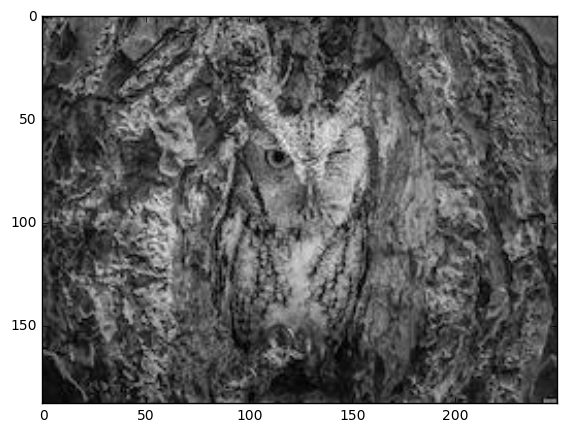

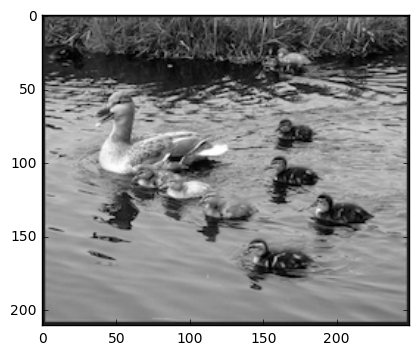

In [135]:
from skimage import data, io, filters
from skimage.io import imread
from skimage.color import rgb2grey
import matplotlib.pyplot as plt
d = imread('ducks.jpg')
plt.figure(figsize=(15, 5))
    
o = imread('owl.jpg')
plt.figure(figsize=(15, 5))
    
o = rgb2grey(o)
plt.imshow(o[:,:])
    
plt.show()
    
d = rgb2grey(d)
plt.imshow(d[:,:])

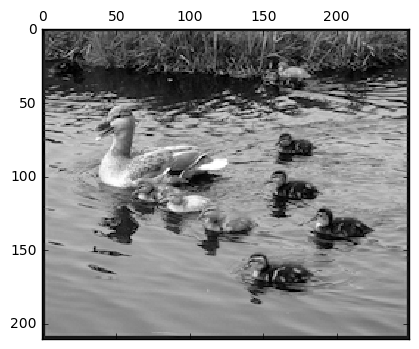

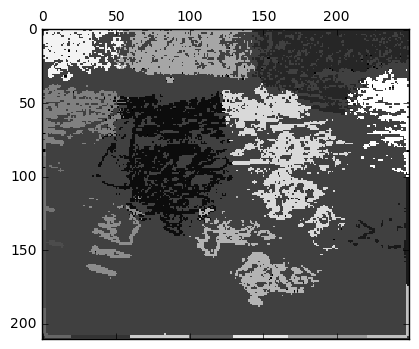

In [132]:
from sklearn.feature_extraction import image
from sklearn.cluster import spectral_clustering

mask = d.astype(bool)
graph = image.img_to_graph(d, mask=mask)

labels = spectral_clustering(graph, n_clusters=20)
label_im = -np.ones(mask.shape)
label_im[mask] = labels

plt.matshow(d)
plt.matshow(label_im)

plt.show()

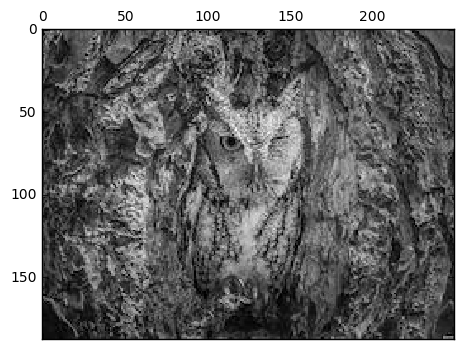

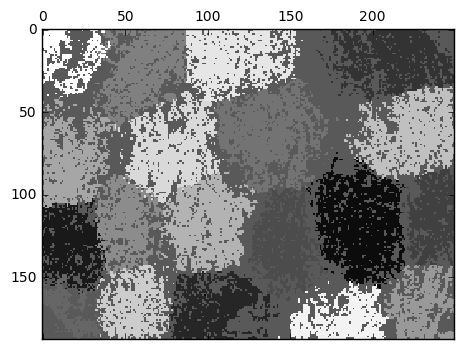

In [139]:
from sklearn.feature_extraction import image
from sklearn.cluster import spectral_clustering

mask = o.astype(bool)
graph = image.img_to_graph(o, mask=mask)

labels = spectral_clustering(graph, n_clusters=20)
o_label_im = -np.ones(mask.shape)
o_label_im[mask] = labels

plt.matshow(o)
plt.matshow(o_label_im)

plt.show()

**6. (1 балл)** Визуализируйте результаты сегментации (аналогично рисунку выше) для обоих методов. [Пример кода для визуализации](http://scikit-learn.org/0.16/auto_examples/cluster/plot_lena_segmentation.html).

In [15]:
from sklearn.cluster import KMeans
import numpy as np

def kmeans_image_cl(img, l, cl_num):
    matrix = []
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            matrix += [[l * i, l * j, img[i][j][0], img[i][j][1], img[i][j][2]]]
        
    kmeans = KMeans(n_clusters=cl_num).fit(matrix)
    labels = kmeans.predict(matrix).reshape((img.shape[0], img.shape[1]))

    plt.imshow(img)
    for l in range(cl_num):
        plt.contour(labels == l, contours=1,
            colors=[plt.cm.spectral(l / float(cl_num))])
    plt.xticks(())
    plt.yticks(())
    plt.show()
    

    
from sklearn.feature_extraction import image
from sklearn.cluster import spectral_clustering
from skimage.color import rgb2grey

def sp_image_cl(img, cl_num):    
    graph = image.img_to_graph(img)

    labels = spectral_clustering(graph, n_clusters=cl_num)
    labels = labels.reshape(img.shape)
    plt.gray() 

    plt.figure(figsize=(5, 5))
    plt.imshow(img)
    for l in range(cl_num):
        plt.contour(labels == l, contours=1,
                    colors=[plt.cm.spectral(l / float(cl_num))])
    plt.xticks(())
    plt.yticks(())
    plt.show()

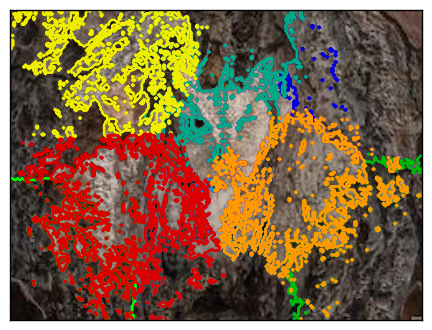

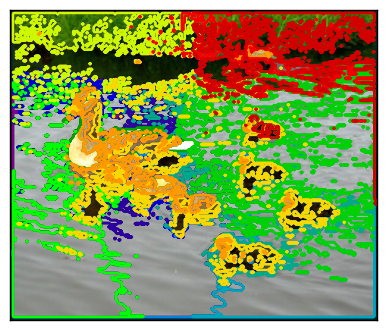

In [157]:
d = imread('ducks.jpg')
o = imread('owl.jpg')
kmeans_image_cl(o, 2, 10)

kmeans_image_cl(d, 0.5, 15)

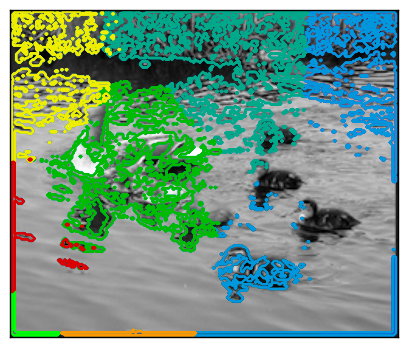

In [166]:
sp_image_cl(d, 10)

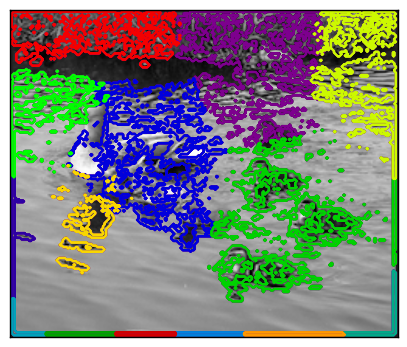

In [167]:
sp_image_cl(d, 15)

**7. (1 балл)** Поэкспериментируйте с параметрами алгоритмов и параметром $\lambda$ в признаках Сравните два подхода и сегментации, к которым они приводят.
Для всех ли изображений в результате сегментации хорошо видны контуры объектов?

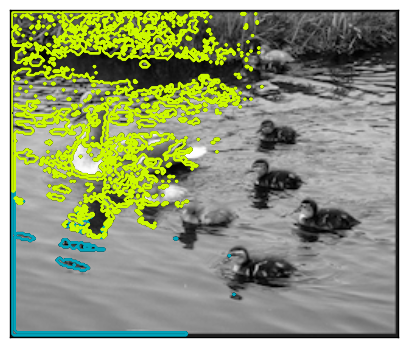

l 0.5 cl_num 3


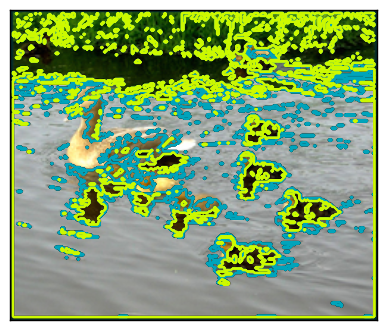

l 1.5 cl_num 3


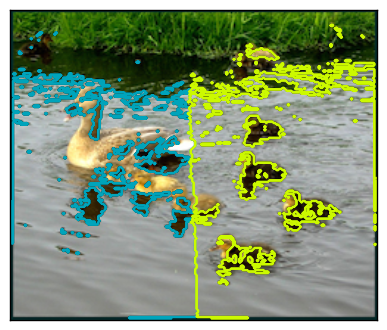

l 2.5 cl_num 3


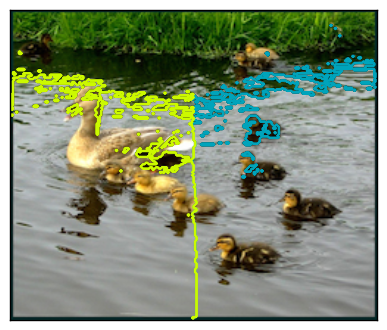

l 3.5 cl_num 3


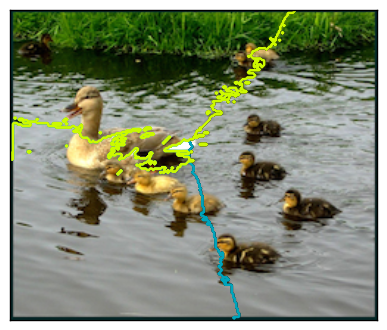

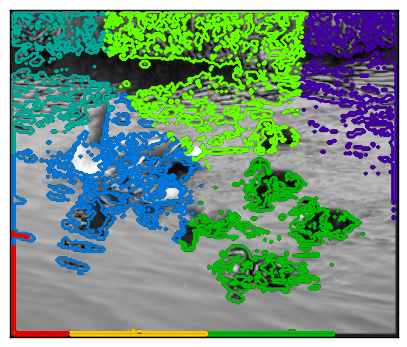

l 0.5 cl_num 8


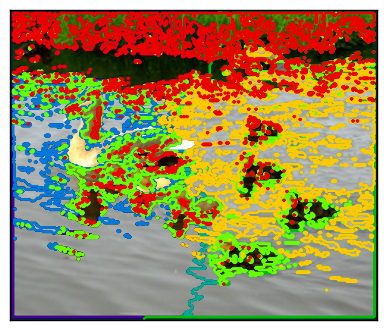

l 1.5 cl_num 8


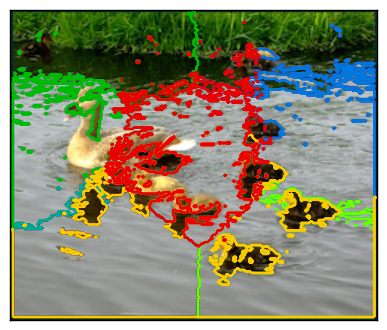

l 2.5 cl_num 8


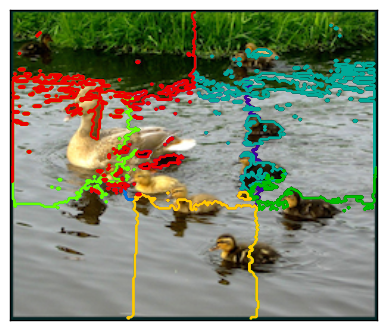

l 3.5 cl_num 8


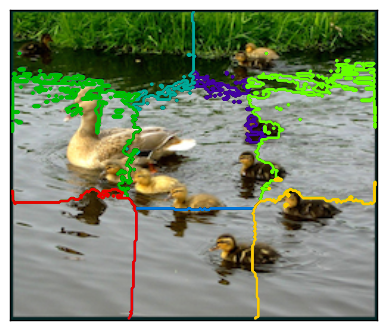

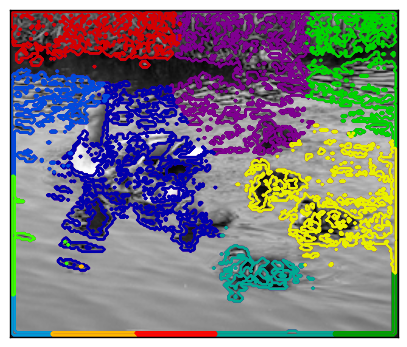

l 0.5 cl_num 13


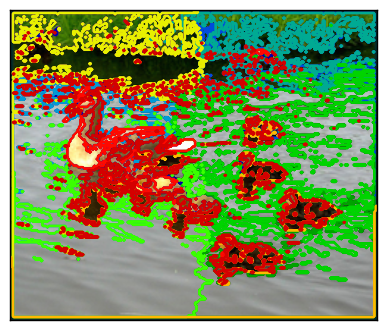

l 1.5 cl_num 13


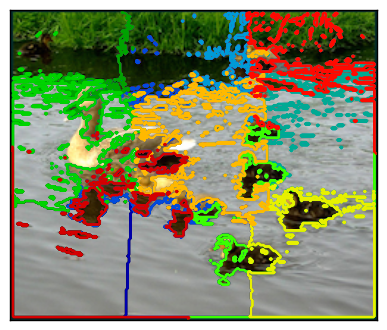

l 2.5 cl_num 13


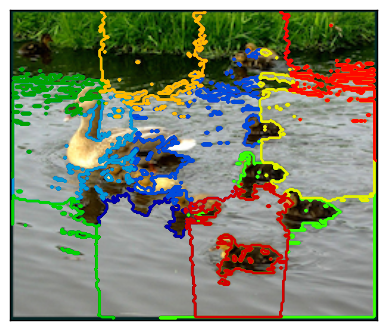

l 3.5 cl_num 13


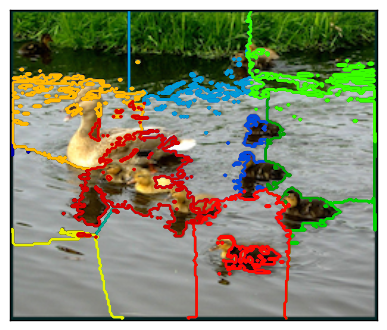

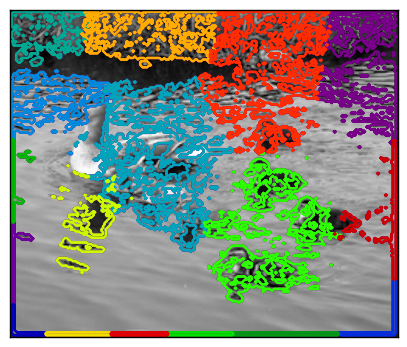

l 0.5 cl_num 18


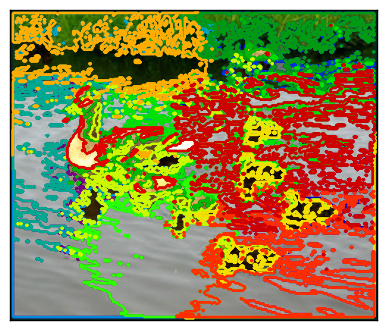

l 1.5 cl_num 18


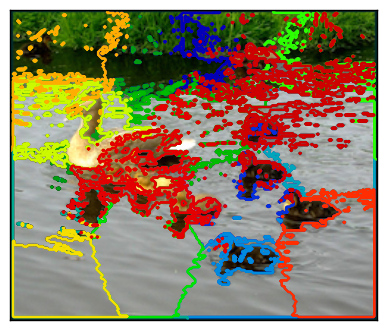

l 2.5 cl_num 18


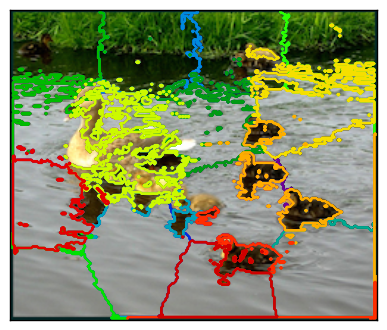

l 3.5 cl_num 18


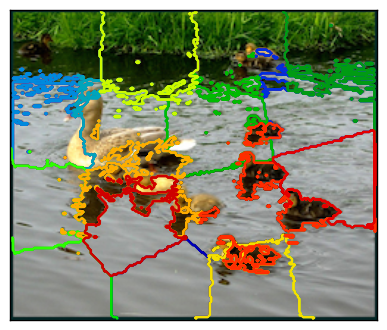

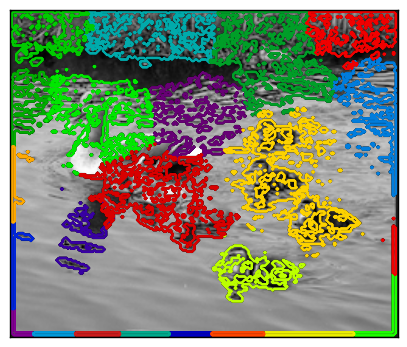

l 0.5 cl_num 23


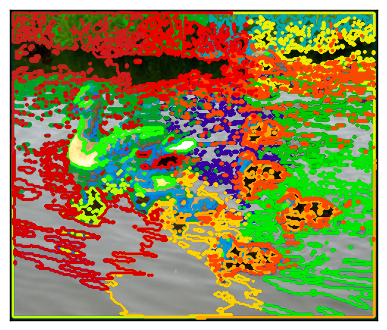

l 1.5 cl_num 23


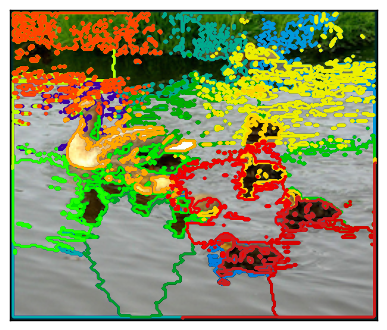

l 2.5 cl_num 23


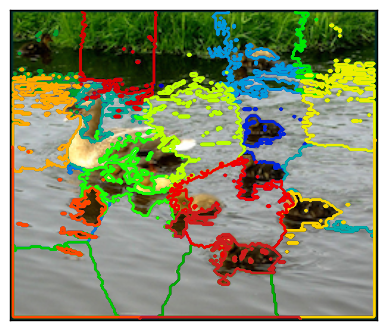

l 3.5 cl_num 23


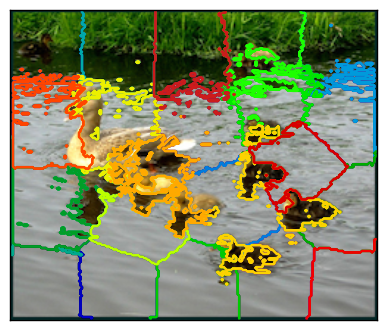

In [16]:
cl_num = 3
d = imread('ducks.jpg')
g_d = rgb2grey(d)

while (cl_num < 25):
    sp_image_cl(g_d, cl_num)
    l = 0.5
    while l < 4:    
        print("l", l, "cl_num", cl_num)
        kmeans_image_cl(d, l, cl_num)
        l += 1
    cl_num += 5

l 0.5 cl_num 3


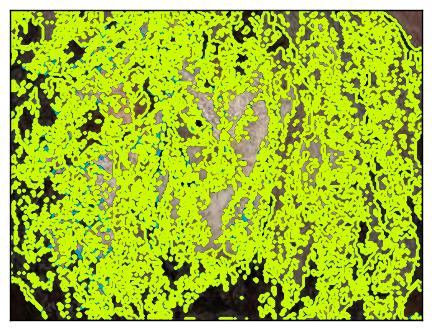

l 1.75 cl_num 3


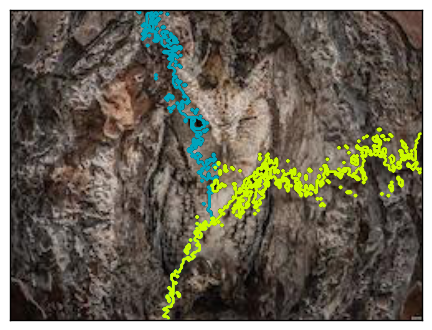

l 3.0 cl_num 3


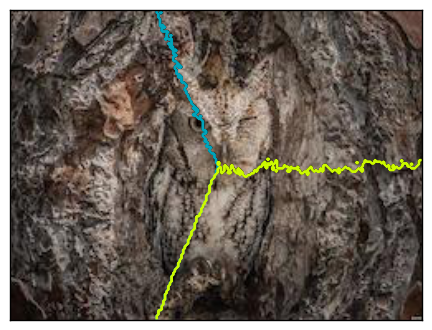

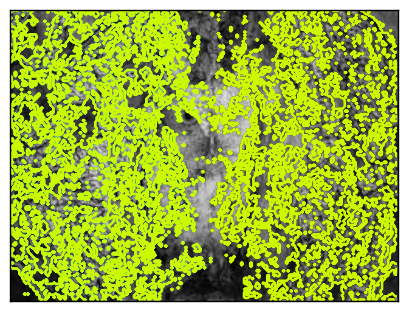

l 0.5 cl_num 8


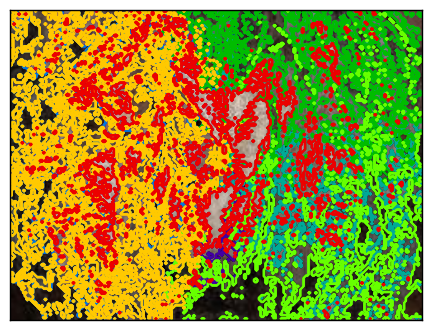

l 1.75 cl_num 8


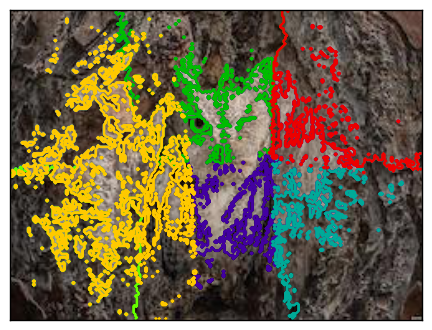

l 3.0 cl_num 8


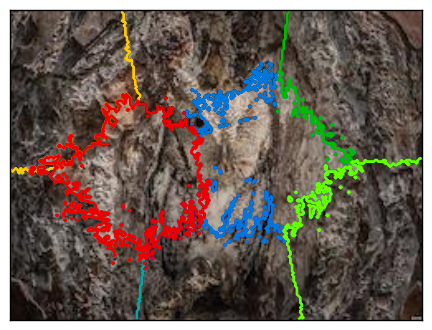

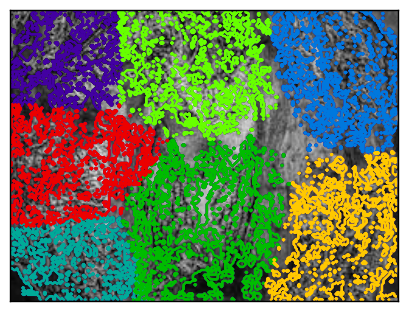

l 0.5 cl_num 13


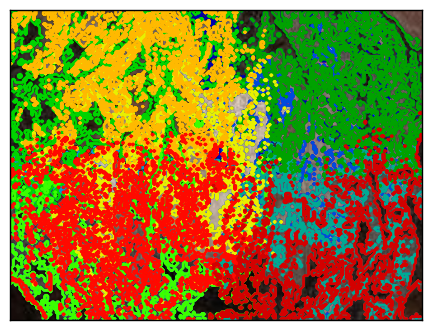

l 1.75 cl_num 13


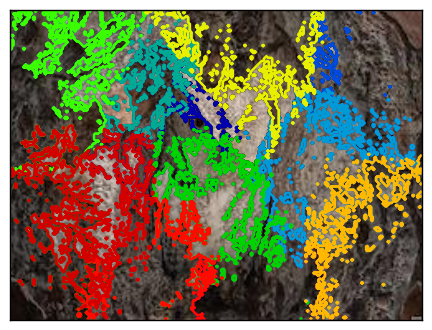

l 3.0 cl_num 13


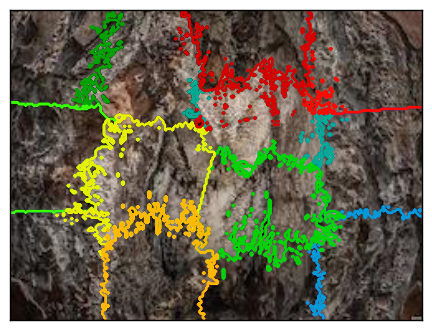

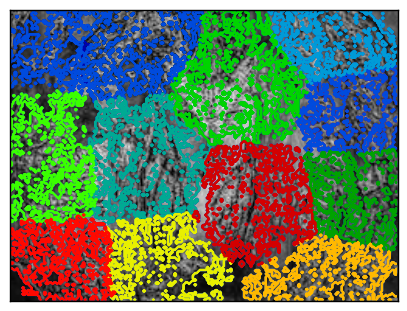

l 0.5 cl_num 18


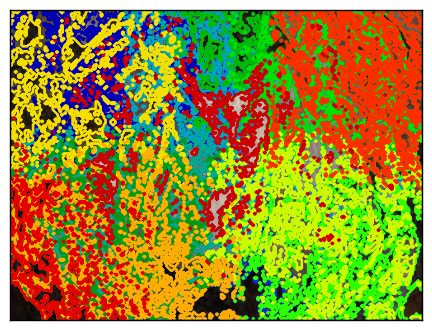

l 1.75 cl_num 18


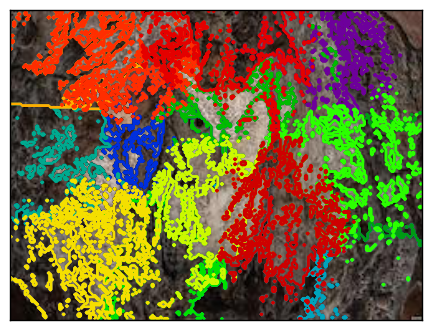

l 3.0 cl_num 18


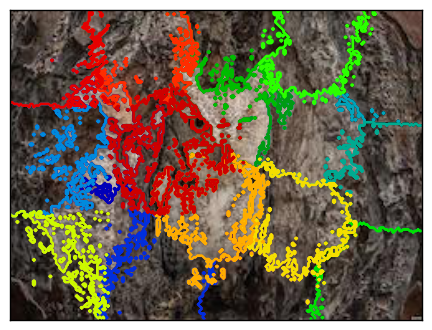

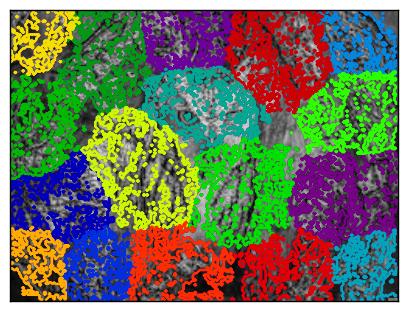

l 0.5 cl_num 23


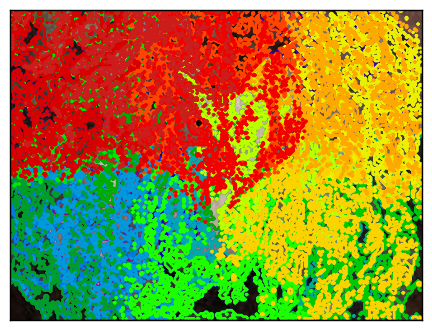

l 1.75 cl_num 23


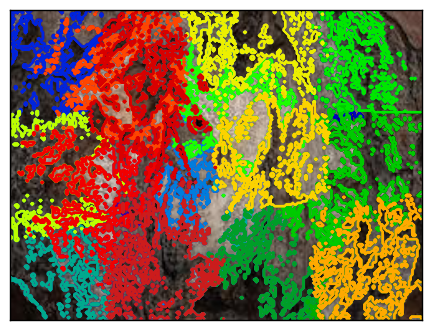

l 3.0 cl_num 23


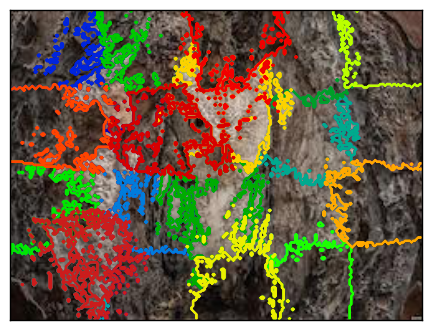

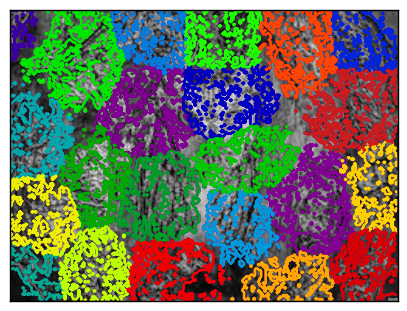

In [17]:
cl_num = 3
o = imread('owl.jpg')
g_o = rgb2grey(o)

while (cl_num < 25):
    l = 0.5
    while l < 4:    
        print("l", l, "cl_num", cl_num)
        kmeans_image_cl(o, l, cl_num)
        l += 1.25
    sp_image_cl(g_o, cl_num)
    cl_num += 5

для уток хорошо выделяются края при 
l 0.5 cl_num 3

l 1.5 cl_num 13

cl_num 18 -- спектральный анализ

l 2.5 cl_num 18


cl_num 23

для совы 

l 0.5 cl_num 8 

l 1.75 cl_num 8

l 3.0 cl_num 18

l 3.0 cl_num 23

на спектральном анализе совы границ практически не видно

вообще спектральный анализ оказался хуже kmeans 


Измерять качество сегментации в этом пункте не нужно, в результате ожидаются только картинки и выводы.

### Рекомендации к выполнению
Для работы с изображениями удобно использовать библиотеку [Scikit-Image](http://scikit-image.org). 
Установите [PIL](http://www.pythonware.com/products/pil/) для возможности чтения формата JPG.

Пример чтения изображения в матрицу:

    from skimage.io import imread
    I = imread('http://www.birdsgallery.net/gallery/parrots/parrots_4.jpg')

    figure(figsize=(15, 5))
        for i in xrange(3):
        subplot(1, 3, i)
        imshow(I[:,:,i])

## Word2vec

**8. (3 балла)**
1. [Скачайте данные](https://www.kaggle.com/c/word2vec-nlp-tutorial/data)
2. [Установите необходимые библиотеки](https://www.kaggle.com/c/word2vec-nlp-tutorial/details/setting-up-your-system)
3. Внимательно изучите тьториалы, доступные в рамках контеста [Part 1](https://www.kaggle.com/c/word2vec-nlp-tutorial/details/part-1-for-beginners-bag-of-words) – [Part 4](https://www.kaggle.com/c/word2vec-nlp-tutorial/details/part-4-comparing-deep-and-non-deep-learning-methods). Эти статьи очень полезны для понимания принципов анализа текстовых данных в питоне.
4. Согласно тьюториалам подготовить данные и обучить модель word2vec. Полезно засечь время обучения модели.
5. Протестировать модель на датасете, подготовленном Google, с задачами вида: *London → England*, значит, *Berlin → Germany*. Пример вызова нужной функции и описание датасета есть [тьюториале по word2vec](https://rare-technologies.com/word2vec-tutorial/). Сам датасет можно скачать по [ссылке](https://www.dropbox.com/s/prb8n5b5na5qo07/questions-words.txt?dl=0). С чем может быть связано большое число неверных ответов?
6. Привести по 5-10 примеров для задачи поиска лишнего слова *(model.doesnt_match)* и для задачи поиска семантически близких слов *(model.most_similar)*. Проинтерпретировать полученные результаты. Все ли примеры соответствуют здравому смыслу? По каким принципам группируются близкие слова в выбранных вами примерах?

Весь код взят за тьюториала

In [169]:
import pandas as pd
train = pd.read_csv("labeledTrainData.tsv", header=0, delimiter="\t", quoting=3)


In [170]:
from bs4 import BeautifulSoup
import re
import nltk

In [176]:
nltk.download('all', halt_on_error=False)

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to /root/nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package alpino to /root/nltk_data...
[nltk_data]    |   Package alpino is already up-to-date!
[nltk_data]    | Downloading package biocreative_ppi to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package biocreative_ppi is already up-to-date!
[nltk_data]    | Downloading package brown to /root/nltk_data...
[nltk_data]    |   Package brown is already up-to-date!
[nltk_data]    | Downloading package brown_tei to /root/nltk_data...
[nltk_data]    |   Package brown_tei is already up-to-date!
[nltk_data]    | Downloading package cess_cat to /root/nltk_data...
[nltk_data]    |   Package cess_cat is already up-to-date!
[nltk_data]    | Downloading package cess_esp to /root/nltk_data...
[nltk_data]    |   Package cess_esp is already up-to-date!
[nltk_data]    | Downloading packag

True

In [186]:
train = pd.read_csv( "labeledTrainData.tsv", header=0,
delimiter="\t", quoting=3, encoding="utf-8")
test = pd.read_csv( "testData.tsv", header=0, delimiter="\t", quoting=3, encoding="utf-8")
unlabeled_train = pd.read_csv( "unlabeledTrainData.tsv", header=0,
 delimiter="\t", quoting=3, encoding="utf-8" )

print("Read %d labeled train reviews, %d labeled test reviews, " \
 "and %d unlabeled reviews\n" % (train["review"].size,
 test["review"].size, unlabeled_train["review"].size ))


Read 25000 labeled train reviews, 25000 labeled test reviews, and 50000 unlabeled reviews



In [187]:
from nltk.corpus import stopwords

def review_to_wordlist( review, remove_stopwords=False ):
    review_text = BeautifulSoup(review).get_text()
    review_text = re.sub("[^a-zA-Z]"," ", review_text)
    words = review_text.lower().split()

    if remove_stopwords:
        stops = set(stopwords.words("english"))
        words = [w for w in words if not w in stops]

    return(words)


In [188]:
# Load the punkt tokenizer
tokenizer = nltk.data.load('tokenizers/punkt/english.pickle')

# Define a function to split a review into parsed sentences
def review_to_sentences( review, tokenizer, remove_stopwords=False ):
    # Function to split a review into parsed sentences. Returns a
    # list of sentences, where each sentence is a list of words
    #
    # 1. Use the NLTK tokenizer to split the paragraph into sentences
    raw_sentences = tokenizer.tokenize(review.strip())
    #
    # 2. Loop over each sentence
    sentences = []
    for raw_sentence in raw_sentences:
        # If a sentence is empty, skip it
        if len(raw_sentence) > 0:
            # Otherwise, call review_to_wordlist to get a list of words
            sentences.append( review_to_wordlist( raw_sentence, \
              remove_stopwords ))
    #
    # Return the list of sentences (each sentence is a list of words,
    # so this returns a list of lists
    return sentences


In [189]:
sentences = []  # Initialize an empty list of sentences

print("Parsing sentences from training set")
for review in train["review"]:
    sentences += review_to_sentences(review, tokenizer)

print("Parsing sentences from unlabeled set")
for review in unlabeled_train["review"]:
    sentences += review_to_sentences(review.encode('utf8', 'replace').decode('utf8'), tokenizer)

import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s',\
    level=logging.INFO)

# Set values for various parameters
num_features = 300    # Word vector dimensionality
min_word_count = 40   # Minimum word count
num_workers = 4       # Number of threads to run in parallel
context = 10          # Context window size
downsampling = 1e-3   # Downsample setting for frequent words


Parsing sentences from training set


/root/anaconda3/envs/python/lib/python3.5/site-packages/bs4/__init__.py:181: UserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 184 of the file /root/anaconda3/envs/python/lib/python3.5/runpy.py. To get rid of this warning, change code that looks like this:

 BeautifulSoup([your markup])

to this:

 BeautifulSoup([your markup], "html.parser")

  markup_type=markup_type))
/root/anaconda3/envs/python/lib/python3.5/site-packages/bs4/__init__.py:219: UserWarning: "b'.'" looks like a filename, not markup. You shouldprobably open this file and pass the filehandle intoBeautiful Soup.
  'Beautiful Soup.' % markup)
/root/anaconda3/envs/python/lib/python3.5/site-packages/bs4/__init__.py:282: UserWarning: "http://

Parsing sentences from unlabeled set


/root/anaconda3/envs/python/lib/python3.5/site-packages/bs4/__init__.py:282: UserWarning: "http://www.archive.org/details/LovefromaStranger"" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/root/anaconda3/envs/python/lib/python3.5/site-packages/bs4/__init__.py:282: UserWarning: "http://www.loosechangeguide.com/LooseChangeGuide.html"" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/root/anaconda3/envs/python/lib/python3.5/site-packages/bs4/__init__.py:282: UserWarning: "http://www.msnbc.msn.com/id/4972055/site/newsweek/"" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an 

In [239]:
# Initialize and train the model (this will take some time)
from gensim.models import word2vec
print("Training model...")


# If you don't plan to train the model any further, calling
# init_sims will make the model much more memory-efficient.
model.init_sims(replace=True)

# It can be helpful to create a meaningful model name and
# save the model for later use. You can load it later using Word2Vec.load()


2016-12-18 16:38:11,164 : INFO : collecting all words and their counts
2016-12-18 16:38:11,166 : INFO : PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
2016-12-18 16:38:11,226 : INFO : PROGRESS: at sentence #10000, processed 225803 words, keeping 17776 word types
2016-12-18 16:38:11,285 : INFO : PROGRESS: at sentence #20000, processed 451892 words, keeping 24948 word types
2016-12-18 16:38:11,341 : INFO : PROGRESS: at sentence #30000, processed 671314 words, keeping 30034 word types


Training model...


2016-12-18 16:38:11,397 : INFO : PROGRESS: at sentence #40000, processed 897814 words, keeping 34348 word types
2016-12-18 16:38:11,454 : INFO : PROGRESS: at sentence #50000, processed 1116962 words, keeping 37761 word types
2016-12-18 16:38:11,512 : INFO : PROGRESS: at sentence #60000, processed 1338403 words, keeping 40723 word types
2016-12-18 16:38:11,568 : INFO : PROGRESS: at sentence #70000, processed 1561579 words, keeping 43333 word types
2016-12-18 16:38:11,624 : INFO : PROGRESS: at sentence #80000, processed 1780886 words, keeping 45714 word types
2016-12-18 16:38:11,681 : INFO : PROGRESS: at sentence #90000, processed 2004995 words, keeping 48135 word types
2016-12-18 16:38:11,739 : INFO : PROGRESS: at sentence #100000, processed 2226966 words, keeping 50207 word types
2016-12-18 16:38:11,798 : INFO : PROGRESS: at sentence #110000, processed 2446580 words, keeping 52081 word types
2016-12-18 16:38:11,855 : INFO : PROGRESS: at sentence #120000, processed 2668775 words, keepin

In [199]:
from gensim.models import Word2Vec

def makeFeatureVec(words, model, num_features):
    # Function to average all of the word vectors in a given
    # paragraph
    #
    # Pre-initialize an empty numpy array (for speed)
    featureVec = np.zeros((num_features,),dtype="float32")
    #
    nwords = 0.
    #
    # Index2word is a list that contains the names of the words in
    # the model's vocabulary. Convert it to a set, for speed
    index2word_set = set(model.index2word)
    #
    # Loop over each word in the review and, if it is in the model's
    # vocaublary, add its feature vector to the total
    for word in words:
        if word in index2word_set:
            nwords = nwords + 1.
            featureVec = np.add(featureVec,model[word])
    #
    # Divide the result by the number of words to get the average
    featureVec = np.divide(featureVec,nwords)
    return featureVec

def getAvgFeatureVecs(reviews, model, num_features):
    # Given a set of reviews (each one a list of words), calculate
    # the average feature vector for each one and return a 2D numpy array
    #
    # Initialize a counter
    counter = 0.
    #
    # Preallocate a 2D numpy array, for speed
    reviewFeatureVecs = np.zeros((len(reviews),num_features),dtype="float32")
    #
    # Loop through the reviews
    for review in reviews:
        # Print a status message every 1000th review
        if counter%1000. == 0.:
            print("Review %d of %d" % (counter, len(reviews)))
        # Call the function (defined above) that makes average feature vectors
        reviewFeatureVecs[counter] = makeFeatureVec(review, model, \
            num_features)
        #
        # Increment the counter
        counter = counter + 1.
    return reviewFeatureVecs


2016-12-18 15:47:35,871 : INFO : loading Word2Vec object from 300features_40minwords_10context
2016-12-18 15:47:36,243 : INFO : setting ignored attribute syn0norm to None
2016-12-18 15:47:36,245 : INFO : setting ignored attribute cum_table to None
2016-12-18 15:47:36,245 : INFO : loaded 300features_40minwords_10context


In [200]:
clean_train_reviews = []
for review in train["review"]:
    clean_train_reviews.append(review_to_wordlist( review, \
        remove_stopwords=True ))

trainDataVecs = getAvgFeatureVecs( clean_train_reviews, model, num_features )

print("Creating average feature vecs for test reviews")
clean_test_reviews = []
for review in test["review"]:
    clean_test_reviews.append( review_to_wordlist( review, \
        remove_stopwords=True ))

testDataVecs = getAvgFeatureVecs( clean_test_reviews, model, num_features )

# Fit a random forest to the training data, using 100 trees
from sklearn.ensemble import RandomForestClassifier
forest = RandomForestClassifier( n_estimators = 100 )

print("Fitting a random forest to labeled training data...")
forest = forest.fit( trainDataVecs, train["sentiment"] )

/root/anaconda3/envs/python/lib/python3.5/site-packages/bs4/__init__.py:181: UserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 184 of the file /root/anaconda3/envs/python/lib/python3.5/runpy.py. To get rid of this warning, change code that looks like this:

 BeautifulSoup([your markup])

to this:

 BeautifulSoup([your markup], "html.parser")

  markup_type=markup_type))


Review 0 of 25000
Review 1000 of 25000
Review 2000 of 25000
Review 3000 of 25000
Review 4000 of 25000
Review 5000 of 25000
Review 6000 of 25000
Review 7000 of 25000
Review 8000 of 25000
Review 9000 of 25000
Review 10000 of 25000
Review 11000 of 25000
Review 12000 of 25000
Review 13000 of 25000
Review 14000 of 25000
Review 15000 of 25000
Review 16000 of 25000
Review 17000 of 25000
Review 18000 of 25000
Review 19000 of 25000
Review 20000 of 25000
Review 21000 of 25000
Review 22000 of 25000
Review 23000 of 25000
Review 24000 of 25000
Creating average feature vecs for test reviews
Review 0 of 25000
Review 1000 of 25000
Review 2000 of 25000
Review 3000 of 25000
Review 4000 of 25000
Review 5000 of 25000
Review 6000 of 25000
Review 7000 of 25000
Review 8000 of 25000
Review 9000 of 25000
Review 10000 of 25000
Review 11000 of 25000
Review 12000 of 25000
Review 13000 of 25000
Review 14000 of 25000
Review 15000 of 25000
Review 16000 of 25000
Review 17000 of 25000
Review 18000 of 25000
Review 1900

In [207]:
# Test & extract results
result = forest.predict( testDataVecs )

word_vectors = model.syn0
num_clusters = word_vectors.shape[0] / 5
num_clusters = int(num_clusters) - 1
print(num_clusters)

from sklearn.cluster import KMeans
import time
kmeans_clustering = KMeans( n_clusters = num_clusters)
idx = kmeans_clustering.fit( word_vectors )
idx = kmeans_clustering.predict(word_vectors)
word_centroid_map = dict(zip( model.index2word, idx ))




3298.0


In [212]:
word_centroid_map = dict(zip( model.index2word, idx ))

In [219]:
# For the first 10 clusters
for cluster in range(0,10):
    #
    # Print the cluster number
    print("\nCluster %d" % cluster)
    #
    # Find all of the words for that cluster number, and print them out
    words = []
    for i in range(0,len(word_centroid_map.values())):
        if( list(word_centroid_map.values())[i] == cluster ):
            words.append(list(word_centroid_map.values())[i])
    print(words)



Cluster 0
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

Cluster 1
[1, 1, 1]

Cluster 2
[2]

Cluster 3
[3]

Cluster 4
[4, 4, 4, 4, 4, 4]

Cluster 5
[5, 5, 5, 5, 5]

Cluster 6
[6, 6, 6, 6]

Cluster 7
[7, 7, 7, 7, 7, 7, 7, 7, 7]

Cluster 8
[8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8]

Cluster 9
[9, 9, 9, 9, 9, 9]


In [220]:
def create_bag_of_centroids( wordlist, word_centroid_map ):
    #
    # The number of clusters is equal to the highest cluster index
    # in the word / centroid map
    num_centroids = max( word_centroid_map.values() ) + 1
    #
    # Pre-allocate the bag of centroids vector (for speed)
    bag_of_centroids = np.zeros( num_centroids, dtype="float32" )
    #
    # Loop over the words in the review. If the word is in the vocabulary,
    # find which cluster it belongs to, and increment that cluster count
    # by one
    for word in wordlist:
        if word in word_centroid_map:
            index = word_centroid_map[word]
            bag_of_centroids[index] += 1
    #
    # Return the "bag of centroids"
    return bag_of_centroids


In [221]:
# Pre-allocate an array for the training set bags of centroids (for speed)
train_centroids = np.zeros( (train["review"].size, num_clusters), \
    dtype="float32" )

# Transform the training set reviews into bags of centroids
counter = 0
for review in clean_train_reviews:
    train_centroids[counter] = create_bag_of_centroids( review, \
        word_centroid_map )
    counter += 1

# Repeat for test reviews
test_centroids = np.zeros(( test["review"].size, num_clusters), \
    dtype="float32" )

counter = 0
for review in clean_test_reviews:
    test_centroids[counter] = create_bag_of_centroids( review, \
        word_centroid_map )
    counter += 1


In [222]:
# Fit a random forest and extract predictions
forest = RandomForestClassifier(n_estimators = 100)

# Fitting the forest may take a few minutes
print("Fitting a random forest to labeled training data...")
forest = forest.fit(train_centroids,train["sentiment"])
result = forest.predict(test_centroids)

import gensim, logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s',\
    level=logging.INFO)
from gensim.models import Word2Vec

results = model.accuracy('questions-words.txt')

Fitting a random forest to labeled training data...


2016-12-18 16:26:29,254 : INFO : loading Word2Vec object from 300features_40minwords_10context
2016-12-18 16:26:29,602 : INFO : setting ignored attribute syn0norm to None
2016-12-18 16:26:29,604 : INFO : setting ignored attribute cum_table to None
2016-12-18 16:26:29,605 : INFO : loaded 300features_40minwords_10context
2016-12-18 16:26:29,664 : INFO : precomputing L2-norms of word weight vectors
2016-12-18 16:26:29,898 : INFO : capital-common-countries: 24.5% (27/110)
2016-12-18 16:26:30,061 : INFO : capital-world: 22.1% (15/68)
2016-12-18 16:26:30,138 : INFO : currency: 0.0% (0/40)
2016-12-18 16:26:30,506 : INFO : city-in-state: 1.1% (2/188)
2016-12-18 16:26:31,180 : INFO : family: 68.2% (259/380)
2016-12-18 16:26:32,658 : INFO : gram1-adjective-to-adverb: 6.2% (54/870)
2016-12-18 16:26:33,996 : INFO : gram2-opposite: 10.6% (49/462)
2016-12-18 16:26:35,965 : INFO : gram3-comparative: 57.9% (611/1056)
2016-12-18 16:26:36,765 : INFO : gram4-superlative: 38.3% (194/506)
2016-12-18 16:26:

In [223]:
model.most_similar(positive=['woman', 'king'], negative=['man'])

[('princess', 0.553158700466156),
 ('queen', 0.532520055770874),
 ('prince', 0.478235125541687),
 ('belle', 0.44069185853004456),
 ('bride', 0.43983063101768494),
 ('stella', 0.43268218636512756),
 ('mary', 0.4317398965358734),
 ('lion', 0.428757905960083),
 ('juliet', 0.4281004071235657),
 ('hayward', 0.41764894127845764)]

In [227]:
model.doesnt_match("film series cartoon cat".split())

'cat'

In [235]:
model.doesnt_match("actress actor screenwriter plumber".split())

'plumber'

In [236]:
model.doesnt_match("music words song table".split())

'table'

In [233]:
model.doesnt_match("interesting exciting boring".split())

'boring'

In [251]:
model.doesnt_match("black white green table".split())

'table'

In [252]:
model.doesnt_match("cat dog rabbit man".split())

'man'

In [253]:
model.doesnt_match("hand leg nose man".split())

'man'

In [254]:
model.most_similar("interesting")

[('intriguing', 0.7422948479652405),
 ('entertaining', 0.6306384801864624),
 ('exciting', 0.6150059700012207),
 ('enjoyable', 0.6149159669876099),
 ('fascinating', 0.6067126989364624),
 ('engaging', 0.5886456370353699),
 ('unusual', 0.5827903151512146),
 ('compelling', 0.5806125998497009),
 ('appealing', 0.5651286840438843),
 ('important', 0.5624791979789734)]

In [255]:
model.most_similar("white")

[('robe', 0.7292304039001465),
 ('dahlia', 0.6723625659942627),
 ('leather', 0.49236637353897095),
 ('pitch', 0.491739958524704),
 ('predominantly', 0.4806492328643799),
 ('hispanic', 0.47852030396461487),
 ('lagoon', 0.4680708050727844),
 ('stallion', 0.4680178761482239),
 ('black', 0.46323245763778687),
 ('token', 0.4612480103969574)]

In [256]:
model.most_similar("film")

[('movie', 0.8514311909675598),
 ('flick', 0.6302614808082581),
 ('picture', 0.5937482714653015),
 ('documentary', 0.5917561650276184),
 ('films', 0.5257501602172852),
 ('cinema', 0.5137065649032593),
 ('presentation', 0.5064429044723511),
 ('sequel', 0.48776888847351074),
 ('thriller', 0.4771589934825897),
 ('it', 0.4714944064617157)]

In [234]:
model.similarity('interesting', 'exciting')

0.61945219940850937

In [237]:
model.similarity('black', 'white')

0.47669174794024405

In [238]:
model.similarity('table', 'white')

0.043246020728162471

In [226]:
for i in range (len(results)):
    correct = len(results[i]['correct'])
    incorrect = len(results[i]['incorrect'])
    accuracy = float(correct) / (incorrect + correct)
    print(results[i]['section'], accuracy)

capital-common-countries 0.24545454545454545
capital-world 0.22058823529411764
currency 0.0
city-in-state 0.010638297872340425
family 0.6815789473684211
gram1-adjective-to-adverb 0.06206896551724138
gram2-opposite 0.10606060606060606
gram3-comparative 0.5785984848484849
gram4-superlative 0.383399209486166
gram5-present-participle 0.3861538461538462
gram6-nationality-adjective 0.15204678362573099
gram7-past-tense 0.4043560606060606
gram8-plural 0.3830049261083744
gram9-plural-verbs 0.5887681159420289
total 0.3536454129674469


судя по примерам модель модель получилась достаточно хорошая, лишние слова отбиральсь верно и прочие проерки прошли хорошо но судя повыводу выше модель не прям уж хорошая